In [1]:
import os
import random
import spacy


import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import networkx as nx

from matplotlib.colors import ListedColormap
from umap.umap_ import UMAP
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.preprocessing import MinMaxScaler
from pointgrid import align_points_to_grid




/Users/hana/anaconda3/envs/data/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [8]:
user_path = 'exp/arrangement.csv'
df = pd.read_csv(user_path)

# Categories

In [58]:
subject_dict= {'A': 'Manuals', 'B': 'Italian Art', 'C': 'Italian Artists', 'D': 'Rome','E':'Italian Topography', 'F': 'Travel Literature', 
               'G': 'Sources', 'H': 'Iconography', 'J': 'Ornament','Kat': 'Catalogues','K': 'K','L': 'Congress Publications', 'M': 'Art in General',
                'N': 'Architecture', 'O':'Sculpture', 'P': 'Painting', 'Q': 'Manuscript Illumination', 'R': 'Graphic Arts', 
               'S': 'Applied Arts', 'T': 'Collecting Art, Museum Studies', 'U': 'Registers of Artistic Monuments', 'V': 'Cultural Institutions', 
               'W': 'Non-Italian Artists','X': 'European Topography', 'Y': 'World Topography', 'Z': 'Related Disciplines', ' ': 'None'}

custom_colours = ["#EA522B", "#EFD4D1", "#2A4978", "#8BDBE1", "#ECA19D", "#B48E36", "#E1DCE0", "#B8BFCE", "#E0DCD1", "#91C5E4", 
                  "#6E8EAC", "#D2E7E0", "#ECD096", "#6C9686", "#E6E10F", "#9D4B37", "#A3B49D", "#BDC920", "#DBE3E5", "#6A8B8D", "#EFB3D1"]
custom_colours = [
    "#EA522B", "#EFD4D1", "#2A4978", "#8BDBE1", "#ECA19D", "#B48E36", "#E1DCE0", "#B8BFCE", "#E0DCD1", "#91C5E4",
    "#6E8EAC", "#D2E7E0", "#ECD096", "#6C9686", "#E6E10F", "#9D4B37", "#A3B49D", "#BDC920", "#DBE3E5", "#6A8B8D",
    "#EFB3D1", "#F6A1B4", "#5499C7", "#1C2833"
]
custom_cmap = ListedColormap(custom_colours)

def get_subject(call_number):
    for key, category in subject_dict.items():
        if call_number.startswith(key):
            return category
    return 'Unknown'

df['cat'] = df['Z30_CALL_NO'].apply(get_subject)


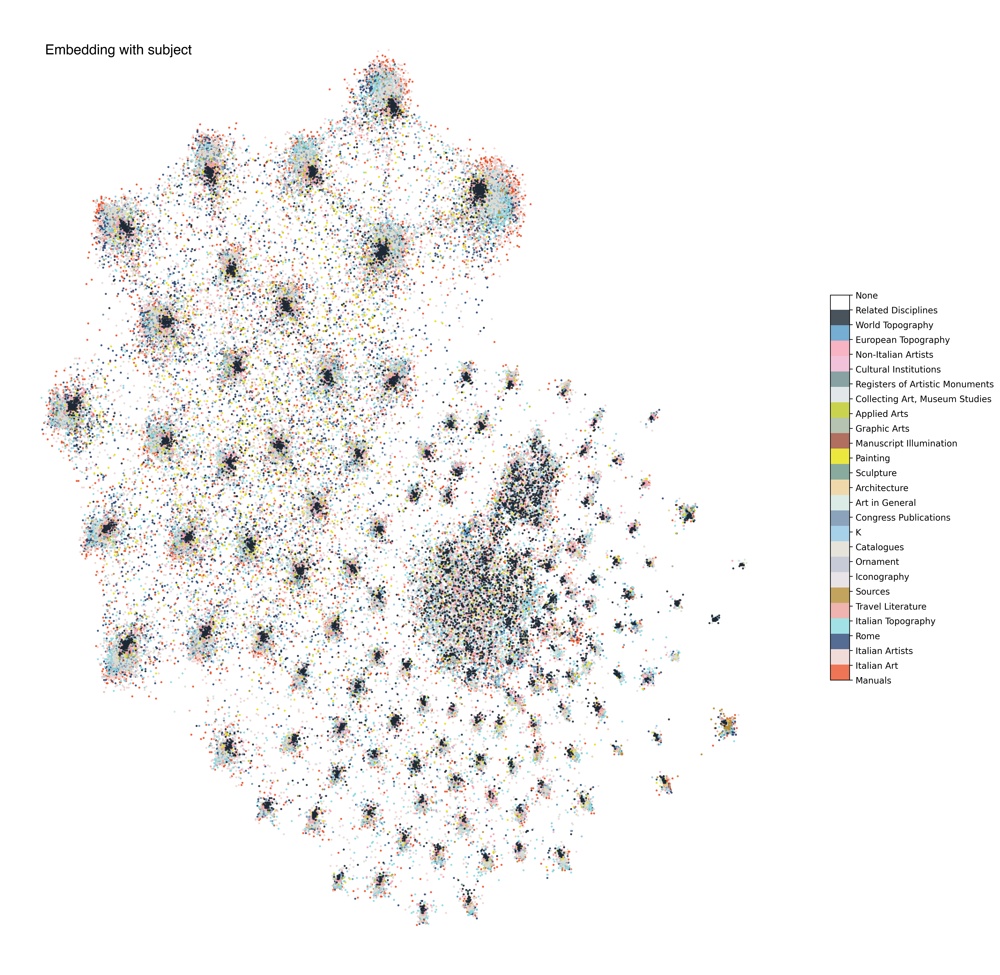

In [60]:
# Create a mapping from labels to color indices
label_to_color_index = {label: idx for idx, label in enumerate(subject_dict.values())}

# Map labels to color indices
color_indices = np.array([label_to_color_index[label] for label in df.cat])


plt.figure(figsize=(20, 20), dpi=300)
plt.axis("off")
scatter = plt.scatter(
    df["x"].to_list(),
    df["y"].to_list(),
    s=2,
    c=color_indices, 
    cmap=custom_cmap, 
    alpha=0.8
)
# Add title in the top left corner
title_text = 'Embedding with subject'
plt.text(0.05, 0.95, title_text, transform=plt.gca().transAxes, fontsize=16, ha='left', fontname='Helvetica')
cbar = plt.colorbar(scatter, shrink=0.4)
cbar.set_ticks([label_to_color_index[label] for label in subject_dict.values()])
cbar.set_ticklabels(list(subject_dict.values()))
plt.show()

In [61]:
# TODO: colorbar, clustering, mean frequency per cluster, linear regression per cluster, keywords or clusters 